In [1]:
import torch
import torchvision
from torchvision.models.detection import (
    fasterrcnn_resnet50_fpn,
    ssd300_vgg16
)
from torchvision.transforms import functional as F
from ultralytics import YOLO
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
import numpy as np
import time
from pathlib import Path
from torchvision.models.detection import FasterRCNN_ResNet50_FPN_Weights, SSD300_VGG16_Weights

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Device: {device}")

faster_rcnn = fasterrcnn_resnet50_fpn(weights='DEFAULT').to(device).eval()
ssd = ssd300_vgg16(weights='DEFAULT').to(device).eval()
yolo = YOLO('yolov8n.pt')  

print("Модели загружены.")

Device: cuda
Модели загружены.


In [8]:
COCO_CLASSES = FasterRCNN_ResNet50_FPN_Weights.DEFAULT.meta["categories"]
print(f"Классов: {len(COCO_CLASSES)}")

def infer_faster_rcnn(img, threshold=0.5):
    tensor = F.to_tensor(img).unsqueeze(0).to(device)
    with torch.no_grad():
        pred = faster_rcnn(tensor)[0]
    boxes = []
    for box, label, score in zip(pred['boxes'], pred['labels'], pred['scores']):
        if score < threshold: continue
        x1, y1, x2, y2 = box.cpu().numpy()
        boxes.append((x1, y1, x2, y2, COCO_CLASSES[label.item()], float(score)))
    return boxes

def infer_ssd(img, threshold=0.5):
    tensor = F.to_tensor(img).unsqueeze(0).to(device)
    with torch.no_grad():
        pred = ssd(tensor)[0]
    boxes = []
    for box, label, score in zip(pred['boxes'], pred['labels'], pred['scores']):
        if score < threshold: continue
        x1, y1, x2, y2 = box.cpu().numpy()
        boxes.append((x1, y1, x2, y2, COCO_CLASSES[label.item()], float(score)))
    return boxes

def infer_yolo(img, threshold=0.5):
    results = yolo(img, verbose=False)[0]
    boxes = []
    for box in results.boxes:
        score = float(box.conf)
        if score < threshold: continue
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        label = yolo.names[int(box.cls)]
        boxes.append((x1, y1, x2, y2, label, score))
    return boxes

Классов: 91


In [9]:
def draw_boxes(ax, img, boxes, title):
    ax.imshow(img)
    ax.set_title(title, fontsize=10)
    ax.axis('off')
    for (x1, y1, x2, y2, label, score) in boxes:
        rect = patches.Rectangle(
            (x1, y1), x2 - x1, y2 - y1,
            linewidth=2, edgecolor='lime', facecolor='none'
        )
        ax.add_patch(rect)
        ax.text(
            x1, y1 - 5, f"{label} {score:.2f}",
            color='white', fontsize=7,
            bbox=dict(facecolor='green', alpha=0.6, pad=1)
        )

def compare_on_image(img_path, threshold=0.5):
    img = Image.open(img_path).convert("RGB")
    
    # Замер времени
    t0 = time.time(); b_frcnn = infer_faster_rcnn(img, threshold); t_frcnn = (time.time()-t0)*1000
    t0 = time.time(); b_ssd   = infer_ssd(img, threshold);        t_ssd   = (time.time()-t0)*1000
    t0 = time.time(); b_yolo  = infer_yolo(img, threshold);       t_yolo  = (time.time()-t0)*1000
    
    # Рисуем 4 панели: оригинал + 3 результата
    fig, axes = plt.subplots(1, 4, figsize=(24, 6))
    axes[0].imshow(img); axes[0].set_title(f"Оригинал: {Path(img_path).name}"); axes[0].axis('off')
    draw_boxes(axes[1], img, b_frcnn, f"Faster R-CNN | {t_frcnn:.0f} ms | {len(b_frcnn)} obj")
    draw_boxes(axes[2], img, b_ssd,   f"SSD          | {t_ssd:.0f} ms | {len(b_ssd)} obj")
    draw_boxes(axes[3], img, b_yolo,  f"YOLOv8       | {t_yolo:.0f} ms | {len(b_yolo)} obj")
    
    plt.tight_layout()
    plt.show()
    
    # Возвращаем статистику для таблицы
    return {
        'image': Path(img_path).name,
        'faster_rcnn': {'time_ms': t_frcnn, 'count': len(b_frcnn)},
        'ssd':         {'time_ms': t_ssd,   'count': len(b_ssd)},
        'yolo':        {'time_ms': t_yolo,  'count': len(b_yolo)},
    }


Папка: lighting | Файл: image_2026-09-21_20-16-42.png


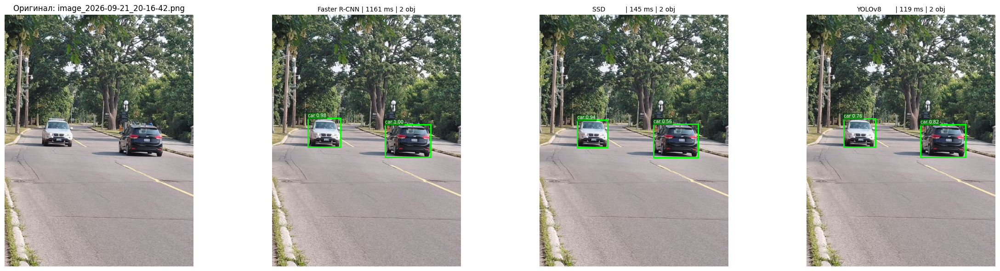


Папка: lighting | Файл: image_2026-09-21_20-17-35.png


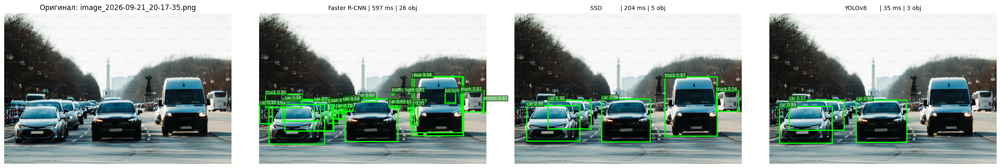


Папка: lighting | Файл: image_2026-09-21_20-18-00.png


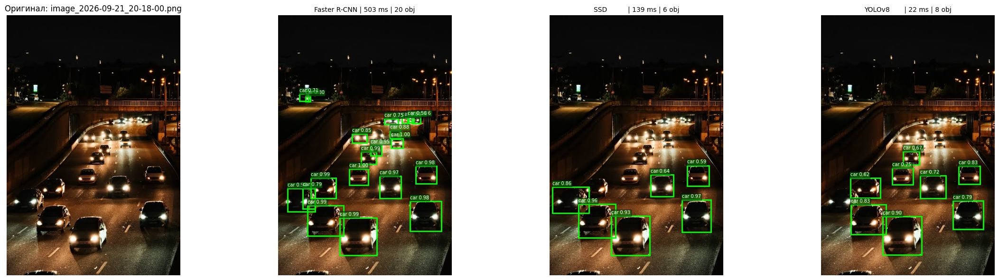


Папка: lighting | Файл: image_2026-09-21_20-18-22.png


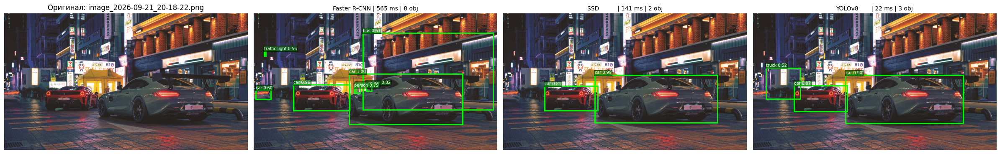


Папка: lighting | Файл: image_2026-09-21_20-19-12.png


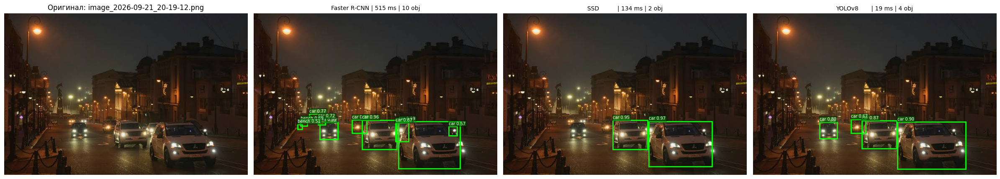


Папка: many_objects | Файл: image_2026-09-21_20-21-05.png


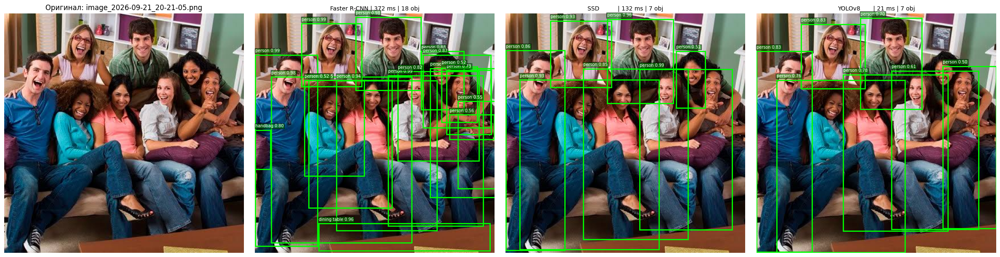


Папка: many_objects | Файл: image_2026-09-21_20-21-26.png


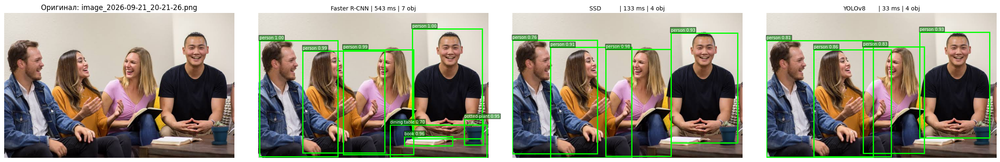


Папка: many_objects | Файл: image_2026-09-21_20-22-00.png


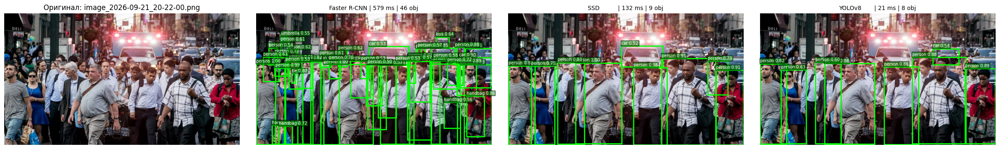


Папка: many_objects | Файл: image_2026-09-21_20-22-21.png


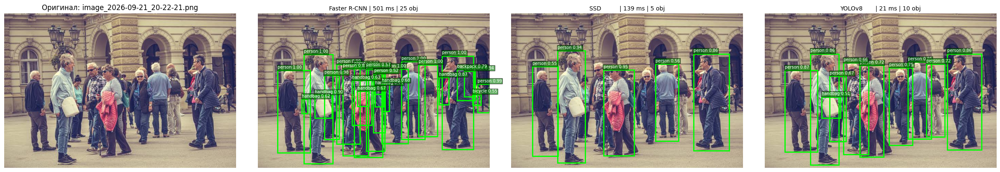


Папка: many_objects | Файл: image_2026-09-21_20-23-11.png


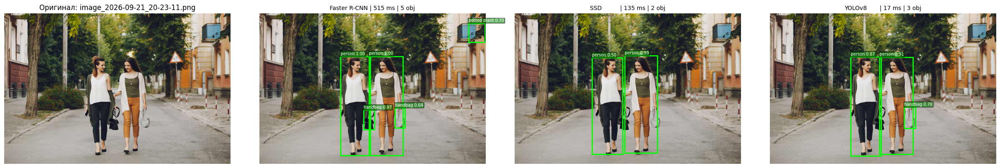


Папка: size_diff | Файл: image_2026-09-21_20-24-04.png


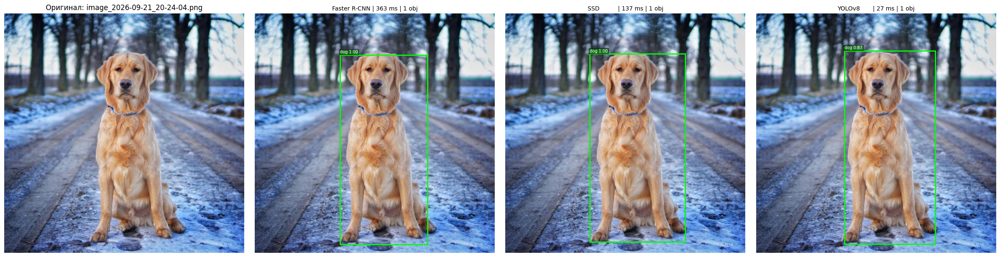


Папка: size_diff | Файл: image_2026-09-21_20-24-26.png


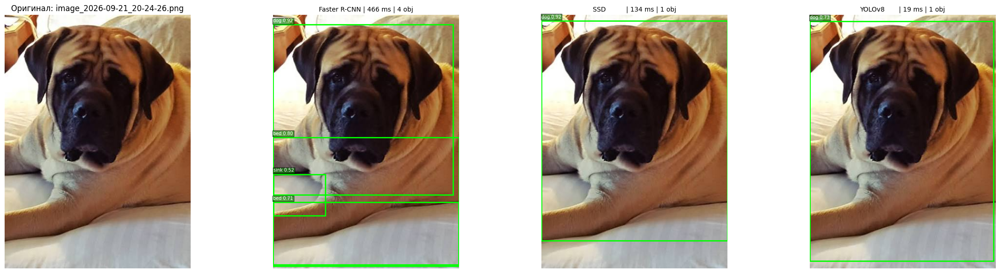


Папка: size_diff | Файл: image_2026-09-21_20-24-42.png


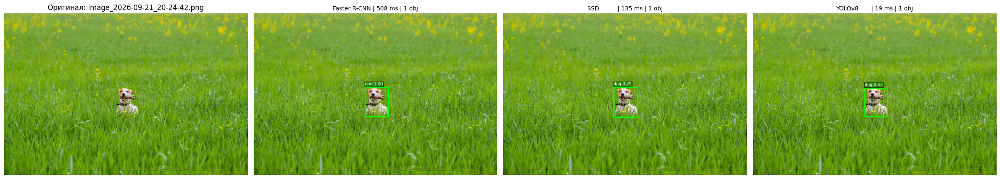


Папка: size_diff | Файл: image_2026-09-21_20-25-06.png


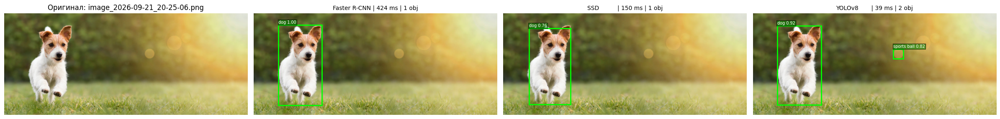


Папка: size_diff | Файл: image_2026-09-21_20-25-46.png


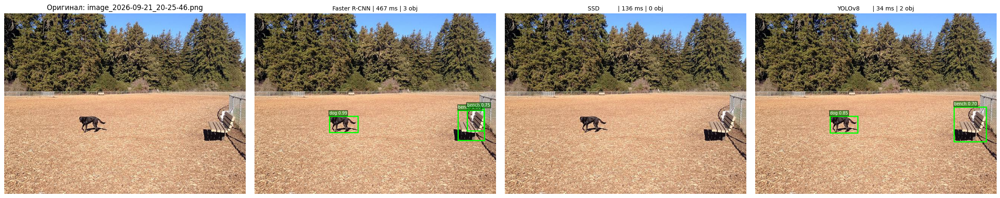

In [10]:
from pathlib import Path

ROOT = Path("images")
all_stats = []

# Рекурсивно проходим по всем подпапкам
for img_path in sorted(ROOT.rglob("*")):
    if img_path.suffix.lower() not in (".jpg", ".jpeg", ".png", ".bmp"):
        continue
    print(f"\n{'='*60}\nПапка: {img_path.parent.name} | Файл: {img_path.name}\n{'='*60}")
    stats = compare_on_image(str(img_path))
    stats['category'] = img_path.parent.name
    all_stats.append(stats)

In [11]:
import pandas as pd

rows = []
for s in all_stats:
    rows.append({
        'Категория': s['category'],
        'Картинка': s['image'],
        'FRCNN время (мс)': round(s['faster_rcnn']['time_ms']),
        'FRCNN объектов': s['faster_rcnn']['count'],
        'SSD время (мс)': round(s['ssd']['time_ms']),
        'SSD объектов': s['ssd']['count'],
        'YOLO время (мс)': round(s['yolo']['time_ms']),
        'YOLO объектов': s['yolo']['count'],
    })

df = pd.DataFrame(rows)
df

,Категория,Картинка,FRCNN время (мс),FRCNN объектов,SSD время (мс),SSD объектов,YOLO время (мс),YOLO объектов
0,lighting,image_2026-09-21_20-16-42.png,1161,2,145,2,119,2
1,lighting,image_2026-09-21_20-17-35.png,597,26,204,5,35,3
2,lighting,image_2026-09-21_20-18-00.png,503,20,139,6,22,8
3,lighting,image_2026-09-21_20-18-22.png,565,8,141,2,22,3
4,lighting,image_2026-09-21_20-19-12.png,515,10,134,2,19,4
5,many_objects,image_2026-09-21_20-21-05.png,372,18,132,7,21,7
6,many_objects,image_2026-09-21_20-21-26.png,543,7,133,4,33,4
7,many_objects,image_2026-09-21_20-22-00.png,579,46,132,9,21,8
8,many_objects,image_2026-09-21_20-22-21.png,501,25,139,5,21,10
9,many_objects,image_2026-09-21_20-23-11.png,515,5,135,2,17,3


In [21]:
import cv2
MODEL_COLORS = {
    'faster_rcnn': (0, 255, 0),    
    'ssd':         (255, 128, 0),  
    'yolo':        (0, 0, 255),    
}

def draw_boxes_cv2(frame, boxes, color=(0, 255, 0), thickness=2):
    """Рисует боксы и подписи на кадре OpenCV (BGR)."""
    for (x1, y1, x2, y2, label, score) in boxes:
        x1, y1, x2, y2 = map(int, [x1, y1, x2, y2])
        cv2.rectangle(frame, (x1, y1), (x2, y2), color, thickness)
        text = f"{label} {score:.2f}"
        (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
        cv2.rectangle(frame, (x1, y1 - th - 4), (x1 + tw, y1), color, -1)
        cv2.putText(frame, text, (x1, y1 - 4),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 1, cv2.LINE_AA)
    return frame

In [22]:

def process_video(video_path, output_dir="output_videos", threshold=0.5, save=True):
    """
    Прогоняет видео через три модели, сохраняет три результата и считает FPS.
    """
    video_path = Path(video_path)
    output_dir = Path(output_dir)
    output_dir.mkdir(exist_ok=True)
    
    cap = cv2.VideoCapture(str(video_path))
    if not cap.isOpened():
        print(f"Не удалось открыть {video_path}")
        return None
    
    fps_in = cap.get(cv2.CAP_PROP_FPS)
    w = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
    h = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
    total_frames = int(cap.get(cv2.CAP_PROP_FRAME_COUNT))
    
    print(f"\nВидео: {video_path.name}")
    print(f"  Разрешение: {w}x{h}, FPS источника: {fps_in:.1f}, кадров: {total_frames}")
    
    writers = {}
    if save:
        fourcc = cv2.VideoWriter_fourcc(*'mp4v')
        for name in ['faster_rcnn', 'ssd', 'yolo']:
            out_path = output_dir / f"{video_path.stem}_{name}.mp4"
            writers[name] = cv2.VideoWriter(str(out_path), fourcc, fps_in, (w, h))
    
    # Счётчики времени
    times = {'faster_rcnn': [], 'ssd': [], 'yolo': []}
    counts = {'faster_rcnn': [], 'ssd': [], 'yolo': []}
    
    frame_idx = 0
    while True:
        ret, frame = cap.read()
        if not ret:
            break
        
        # OpenCV даёт BGR, модели ждут RGB
        frame_rgb = cv2.cvtColor(frame, cv2.COLOR_BGR2RGB)
        img_pil = Image.fromarray(frame_rgb)
        
        # --- Faster R-CNN ---
        t0 = time.time()
        b_frcnn = infer_faster_rcnn(img_pil, threshold)
        times['faster_rcnn'].append((time.time() - t0) * 1000)
        counts['faster_rcnn'].append(len(b_frcnn))
        
        # --- SSD ---
        t0 = time.time()
        b_ssd = infer_ssd(img_pil, threshold)
        times['ssd'].append((time.time() - t0) * 1000)
        counts['ssd'].append(len(b_ssd))
        
        # --- YOLO ---
        t0 = time.time()
        b_yolo = infer_yolo(img_pil, threshold)
        times['yolo'].append((time.time() - t0) * 1000)
        counts['yolo'].append(len(b_yolo))
        
        if save:
            writers['faster_rcnn'].write(draw_boxes_cv2(frame.copy(), b_frcnn, MODEL_COLORS['faster_rcnn']))
            writers['ssd'].write(draw_boxes_cv2(frame.copy(), b_ssd, MODEL_COLORS['ssd']))
            writers['yolo'].write(draw_boxes_cv2(frame.copy(), b_yolo, MODEL_COLORS['yolo']))
        
        frame_idx += 1
        if frame_idx % 10 == 0:
            print(f"  Кадр {frame_idx}/{total_frames}", end='\r')
    
    cap.release()
    for w_ in writers.values():
        w_.release()
    
    print(f"\n  Готово. Обработано кадров: {frame_idx}")
    
    stats = {}
    for name in ['faster_rcnn', 'ssd', 'yolo']:
        avg_ms = np.mean(times[name])
        stats[name] = {
            'avg_ms': avg_ms,
            'fps': 1000 / avg_ms,
            'avg_objects': np.mean(counts[name]),
            'total_time_s': np.sum(times[name]) / 1000,
        }
    
    return stats

In [23]:
video_stats = process_video("video2.mp4", output_dir="output_videos", threshold=0.5, save=True)


Видео: video2.mp4
  Разрешение: 3840x2160, FPS источника: 25.0, кадров: 194
  Кадр 190/194
  Готово. Обработано кадров: 194


In [24]:
if video_stats:
    print(f"\n{'='*60}")
    print(f"{'Модель':<15} {'Средн. мс':<12} {'FPS':<10} {'Объектов/кадр':<15}")
    print(f"{'='*60}")
    for name, s in video_stats.items():
        print(f"{name:<15} {s['avg_ms']:<12.1f} {s['fps']:<10.1f} {s['avg_objects']:<15.1f}")
    print(f"{'='*60}")


Модель          Средн. мс    FPS        Объектов/кадр  
faster_rcnn     568.0        1.8        33.1           
ssd             255.5        3.9        3.9            
yolo            51.3         19.5       4.2            


In [25]:
def benchmark_video(video_path, max_frames=100, threshold=0.5):
    """
    Прогоняет первые max_frames кадров через модели, замеряет время.
    Ничего не сохраняет — только цифры.
    """
    cap = cv2.VideoCapture(str(video_path))
    times = {'faster_rcnn': [], 'ssd': [], 'yolo': []}
    
    # Прогрев — первые 3 кадра не считаем (CUDA инициализируется)
    warmup = 3
    frame_idx = 0
    
    while frame_idx < max_frames + warmup:
        ret, frame = cap.read()
        if not ret:
            break
        
        img_pil = Image.fromarray(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))
        
        t0 = time.time(); _ = infer_faster_rcnn(img_pil, threshold); dt = (time.time()-t0)*1000
        if frame_idx >= warmup: times['faster_rcnn'].append(dt)
        
        t0 = time.time(); _ = infer_ssd(img_pil, threshold); dt = (time.time()-t0)*1000
        if frame_idx >= warmup: times['ssd'].append(dt)
        
        t0 = time.time(); _ = infer_yolo(img_pil, threshold); dt = (time.time()-t0)*1000
        if frame_idx >= warmup: times['yolo'].append(dt)
        
        frame_idx += 1
        print(f"Кадр {frame_idx}/{max_frames + warmup}", end='\r')
    
    cap.release()
    
    print(f"\n\n{'Модель':<15} {'Средн. мс':<12} {'FPS':<10} {'Мин, мс':<10} {'Макс, мс':<10}")
    print('='*60)
    for name in ['faster_rcnn', 'ssd', 'yolo']:
        arr = np.array(times[name])
        print(f"{name:<15} {arr.mean():<12.1f} {1000/arr.mean():<10.1f} {arr.min():<10.1f} {arr.max():<10.1f}")
    
    return times

# Запуск
times = benchmark_video("video2.mp4", max_frames=100)

Кадр 103/103

Модель          Средн. мс    FPS        Мин, мс    Макс, мс  
faster_rcnn     571.6        1.7        519.7      709.6     
ssd             254.1        3.9        201.0      395.0     
yolo            53.2         18.8       35.0       107.9     


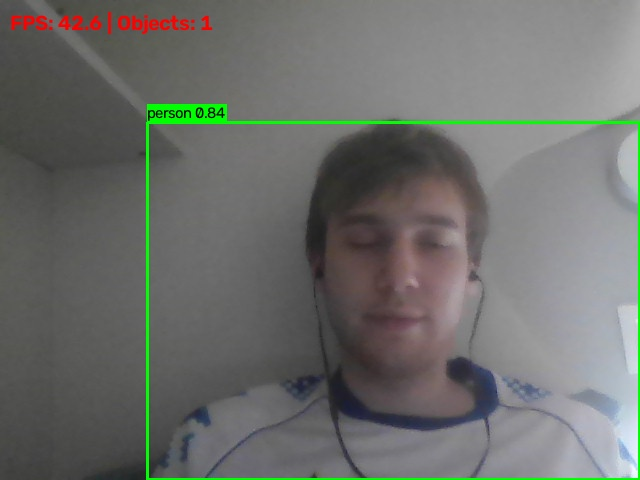

Остановлено пользователем
Камера освобождена


In [27]:
import cv2
import numpy as np
from IPython.display import display, Image, clear_output
import time
from ultralytics import YOLO

model = YOLO('yolov8n.pt')  

# Открываем камеру
cap = cv2.VideoCapture(0)

if not cap.isOpened():
    print("Ошибка: не удалось открыть камеру.")
else:
    print("Нажмите Stop в Jupyter для остановки")
    
    try:
        while True:
            ret, frame = cap.read()
            if not ret:
                print("Ошибка при чтении видео.")
                break
            
            frame = cv2.resize(frame, (640, 480))
            
            t0 = time.time()
            results = model(frame, verbose=False)[0]
            dt = (time.time() - t0) * 1000
            
            for box in results.boxes:
                x1, y1, x2, y2 = map(int, box.xyxy[0].cpu().numpy())
                score = float(box.conf)
                cls_id = int(box.cls)
                label = model.names[cls_id]
                
                # Рамка
                cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
                
                # Подпись с фоном
                text = f"{label} {score:.2f}"
                (tw, th), _ = cv2.getTextSize(text, cv2.FONT_HERSHEY_SIMPLEX, 0.5, 1)
                cv2.rectangle(frame, (x1, y1 - th - 4), (x1 + tw, y1), (0, 255, 0), -1)
                cv2.putText(frame, text, (x1, y1 - 4),
                            cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1, cv2.LINE_AA)
            
            # FPS и количество объектов
            fps = 1000 / dt if dt > 0 else 0
            cv2.putText(frame, f"FPS: {fps:.1f} | Objects: {len(results.boxes)}",
                        (10, 30), cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)
            
            # Вывод в Jupyter
            ret, jpeg = cv2.imencode('.jpg', frame)
            if ret:
                clear_output(wait=True)
                display(Image(data=jpeg.tobytes()))
            
            time.sleep(0.01)
    
    except KeyboardInterrupt:
        print("Остановлено пользователем")
    finally:
        cap.release()
        cv2.destroyAllWindows()
        print("Камера освобождена")

## Детекция белых листов и инференс с изменением цветокора


In [24]:
from huggingface_hub import hf_hub_download
from ultralytics import YOLO

# Скачиваем веса модели (файл model.pt)
model_path = hf_hub_download(
    repo_id="Teklia/yolov11-generic-page", 
    filename="model.pt"
)

# Загружаем модель
model = YOLO(model_path)
print("Модель Teklia загружена.")

`huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Lenovo\.cache\huggingface\hub. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development


model.pt: reconstructing file:   0%|          |  0.00B / 55.9MB            

model.pt: downloading bytes:           |  0.00B            

Модель Teklia загружена.


`huggingface_hub` cache-system uses symlinks by default to efficiently store duplicated files but your machine does not support them in C:\Users\Lenovo\.cache\huggingface\hub\models--Teklia--yolov11-generic-page. Caching files will still work but in a degraded version that might require more space on your disk. This warning can be disabled by setting the `HF_HUB_DISABLE_SYMLINKS_WARNING` environment variable. For more details, see https://huggingface.co/docs/huggingface_hub/how-to-cache#limitations.
To support symlinks on Windows, you either need to activate Developer Mode or to run Python as an administrator. In order to activate developer mode, see this article: https://docs.microsoft.com/en-us/windows/apps/get-started/enable-your-device-for-development


In [ ]:
from PIL import Image
import numpy as np
import cv2

img_pil = Image.open(r"c:\facereco_data\list.jpg").convert("RGB")
img_np = np.array(img_pil)

results = model(img_np, conf=0.3)

print(f"Найдено листов: {len(results[0].boxes)}")

if len(results[0].boxes) > 0:
    box = results[0].boxes[0]
    x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
    print(f"Bounding box: x1={x1:.1f}, y1={y1:.1f}, x2={x2:.1f}, y2={y2:.1f}")
    print(f"Уверенность: {box.conf[0]:.2f}")


0: 640x480 1 single_page, 107.1ms
Speed: 358.2ms preprocess, 107.1ms inference, 2.4ms postprocess per image at shape (1, 3, 640, 480)
Найдено листов: 1
Bounding box: x1=223.9, y1=153.5, x2=773.9, y2=909.9
Уверенность: 0.33


In [ ]:
import cv2
import numpy as np

def correct_white_balance(image, boxes, max_gain=2.5):
 
    if not boxes:
        return image.copy()
    
    h, w = image.shape[:2]
    pixels = []
    
    for (x1, y1, x2, y2) in boxes:
        x1, y1 = max(0, int(x1)), max(0, int(y1))
        x2, y2 = min(w, int(x2)), min(h, int(y2))
        if x2 > x1 and y2 > y1:
            pixels.append(image[y1:y2, x1:x2].reshape(-1, 3))
    
    if not pixels:
        return image.copy()
    
    pixels = np.vstack(pixels)  
    
    p = 95
    b_ref = np.percentile(pixels[:, 0], p)
    g_ref = np.percentile(pixels[:, 1], p)
    r_ref = np.percentile(pixels[:, 2], p)
    
    b_gain = min(255.0 / max(b_ref, 1), max_gain)
    g_gain = min(255.0 / max(g_ref, 1), max_gain)
    r_gain = min(255.0 / max(r_ref, 1), max_gain)
    
    
    result = image.astype(np.float32)
    result[:, :, 0] *= b_gain  # B
    result[:, :, 1] *= g_gain  # G
    result[:, :, 2] *= r_gain  # R
    result = np.clip(result, 0, 255).astype(np.uint8)
    
    return result

Найдено листов: 1


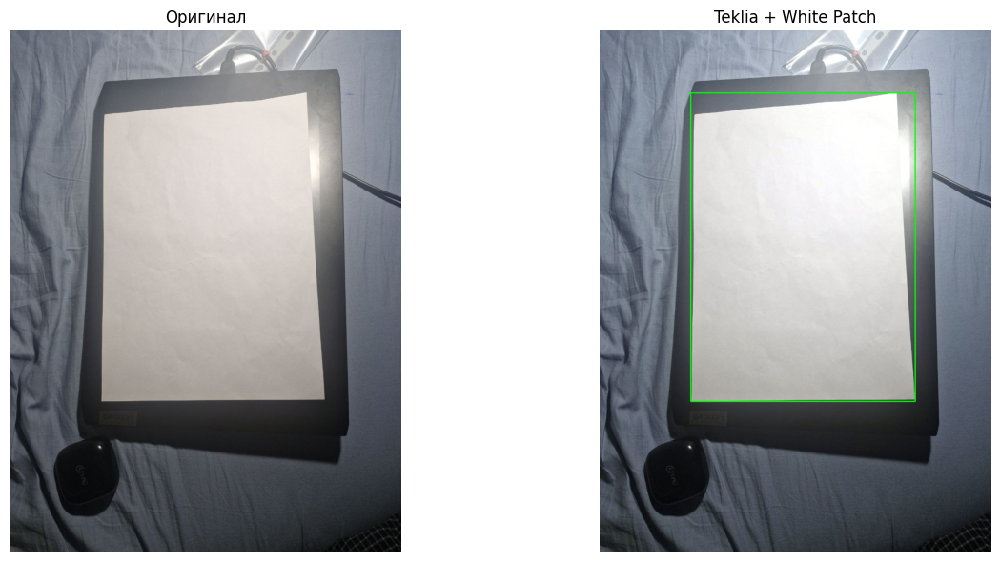

Найдено листов: 1


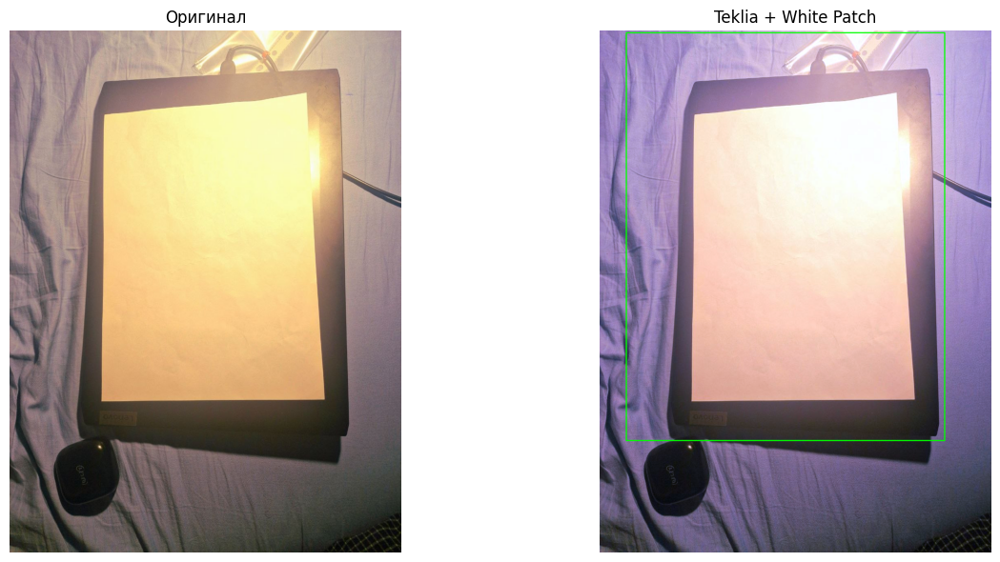

array([[[186, 119, 146],
        [187, 120, 147],
        [187, 120, 147],
        ...,
        [214, 145, 166],
        [219, 146, 168],
        [221, 147, 169]],

       [[189, 121, 148],
        [189, 121, 148],
        [190, 122, 149],
        ...,
        [212, 144, 165],
        [217, 144, 166],
        [218, 145, 167]],

       [[183, 119, 143],
        [183, 119, 143],
        [183, 119, 145],
        ...,
        [215, 146, 167],
        [217, 144, 166],
        [217, 144, 166]],

       ...,

       [[127, 100, 116],
        [124, 100, 116],
        [112,  91, 108],
        ...,
        [ 12,  11,  11],
        [ 22,  18,  18],
        [ 26,  21,  21]],

       [[127,  99, 117],
        [123,  99, 116],
        [113,  91, 110],
        ...,
        [  0,   5,   4],
        [ 11,  13,  12],
        [ 26,  24,  23]],

       [[123,  96, 114],
        [120,  97, 114],
        [113,  91, 110],
        ...,
        [  2,   7,   6],
        [ 18,  18,  17],
        [ 43,  36,  35]]

In [ ]:
from PIL import Image
import numpy as np
import cv2
import matplotlib.pyplot as plt

def process_with_teklia(image_path, conf=0.3):
    img_pil = Image.open(image_path).convert("RGB")
    img_rgb = np.array(img_pil)              
    
    results = model(img_rgb, conf=conf, verbose=False)[0]
    
    boxes = []
    for box in results.boxes:
        x1, y1, x2, y2 = box.xyxy[0].cpu().numpy()
        boxes.append((x1, y1, x2, y2))
    
    print(f"Найдено листов: {len(boxes)}")
    
    img_bgr = cv2.cvtColor(img_rgb, cv2.COLOR_RGB2BGR)
    
    if boxes:
        corrected = correct_white_balance(img_bgr, boxes)
    else:
        corrected = img_bgr.copy()
    
    # Рисуем боксы
    for (x1, y1, x2, y2) in boxes:
        cv2.rectangle(corrected, (int(x1), int(y1)), (int(x2), int(y2)), (0, 255, 0), 2)
    
    # 4. Показ (matplotlib ждёт RGB)
    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    axes[0].imshow(img_rgb)
    axes[0].set_title("Оригинал")
    axes[0].axis('off')
    
    axes[1].imshow(cv2.cvtColor(corrected, cv2.COLOR_BGR2RGB))
    axes[1].set_title("Teklia + White Patch")
    axes[1].axis('off')
    plt.tight_layout()
    plt.show()
    
    return corrected

process_with_teklia(r"c:\facereco_data\list.jpg")
process_with_teklia(r"c:\facereco_data\list2.jpg")